In [2]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import soundfile

%matplotlib inline
%config InlineBackend.figure_format = "retina"

if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(device)

cuda


### Get the Audio File

In [3]:
!wget https://www.vincentsitzmann.com/siren/img/audio/gt_bach.wav

--2024-09-19 16:52:35--  https://www.vincentsitzmann.com/siren/img/audio/gt_bach.wav
Resolving www.vincentsitzmann.com (www.vincentsitzmann.com)... 185.199.110.153, 185.199.108.153, 185.199.111.153, ...
Connecting to www.vincentsitzmann.com (www.vincentsitzmann.com)|185.199.110.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1232886 (1.2M) [audio/wav]
Saving to: 'gt_bach.wav'

gt_bach.wav         100%[===================>]   1.17M  --.-KB/s    in 0.06s   

2024-09-19 16:52:35 (19.3 MB/s) - 'gt_bach.wav' saved [1232886/1232886]



In [4]:
from IPython.display import Audio
Audio('https://file-examples.com/storage/feaf6fc38466e98369950a4/2017/11/file_example_WAV_10MG.wav')

In [5]:
import torchaudio
audio, sr = torchaudio.load('https://file-examples.com/storage/feaf6fc38466e98369950a4/2017/11/file_example_WAV_10MG.wav')

In [6]:
sr

44100

In [7]:
print(audio.shape)
audio = audio[0]

torch.Size([2, 2635988])


In [8]:
tm = audio.shape[0] / sr
print(f"Audio length: {tm} seconds")

Audio length: 59.77297052154195 seconds


In [9]:
audio

tensor([ 3.0518e-05, -3.0518e-05,  0.0000e+00,  ...,  0.0000e+00,
         3.0518e-05,  0.0000e+00])

In [10]:
def audio_plot(audio, sr, clr, tl):
    plt.figure(figsize=(15, 4))
    plt.plot(audio, color = clr, alpha = 0.7)
    plt.xticks(np.arange(0, audio.shape[0], sr), np.arange(0, audio.shape[0] / sr, 1))
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title(tl)
    plt.grid()
    plt.show()

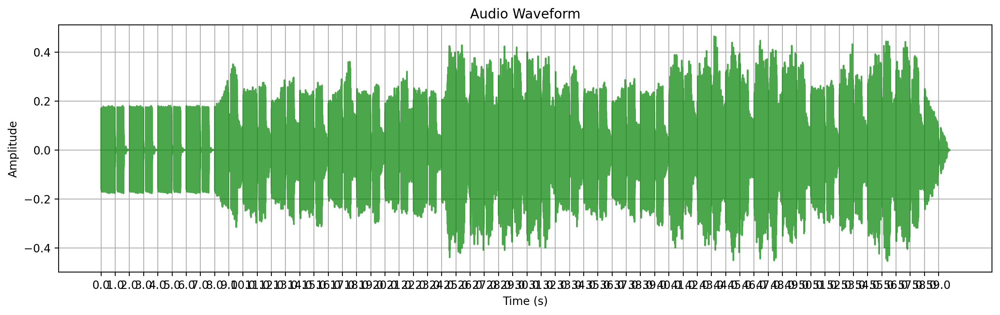

In [11]:
audio_plot(audio, sr, 'green', 'Audio Waveform')

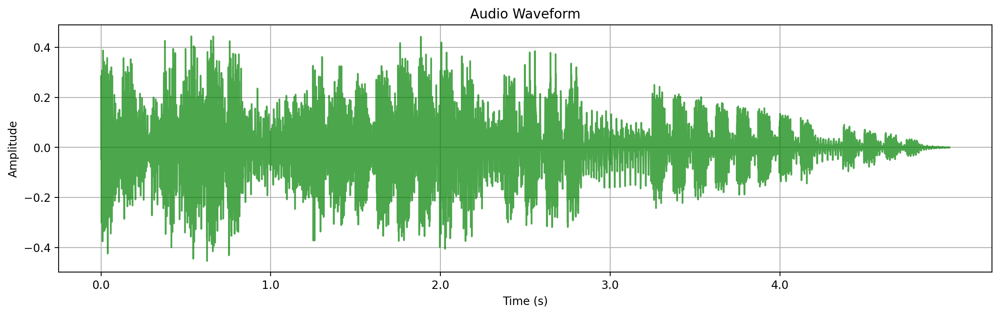

In [12]:
audio = audio[-5*sr:]
audio.shape
audio_plot(audio, sr, 'green', 'Audio Waveform')

In [13]:
X = torch.arange(0, len(audio)).unsqueeze(1).float()
X = X / X.max() * 200 - 100
print(X.shape)
print(X)

torch.Size([220500, 1])
tensor([[-100.0000],
        [ -99.9991],
        [ -99.9982],
        ...,
        [  99.9982],
        [  99.9991],
        [ 100.0000]])


In [14]:
Audio(audio, rate = sr)

In [15]:
from sklearn.kernel_approximation import RBFSampler

def create_rff_features(X, num_features, sigma):
    # Set a random state to the sampler for repoducibility
    rff = RBFSampler(n_components = num_features, gamma = 1 / (2 * sigma**2), random_state = 13)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype = torch.float32)

In [16]:
num_features = 10000
sigma = 0.008

X_rff = create_rff_features(X, num_features, sigma)
print(X_rff.shape)
print(X_rff)

torch.Size([220500, 10000])
tensor([[-0.0133, -0.0113,  0.0069,  ...,  0.0140, -0.0071, -0.0140],
        [-0.0129, -0.0105,  0.0068,  ...,  0.0138, -0.0093, -0.0141],
        [-0.0123, -0.0096,  0.0067,  ...,  0.0134, -0.0111, -0.0139],
        ...,
        [ 0.0136, -0.0029,  0.0009,  ...,  0.0121,  0.0140,  0.0004],
        [ 0.0133, -0.0017,  0.0008,  ...,  0.0114,  0.0135, -0.0019],
        [ 0.0129, -0.0005,  0.0008,  ...,  0.0106,  0.0124, -0.0042]])


In [17]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_rff.numpy(), audio)

pred_audio = model.predict(X_rff.numpy())
print(pred_audio.shape)

(220500,)


### On saving the model weights and sound file

In [18]:
import joblib
joblib.dump(model, 'model.pkl')
model = joblib.load('model.pkl')

import soundfile as sf
sf.write('pred_audio.wav', pred_audio, sr)

In [19]:
print(pred_audio)
print(audio)

[0.15547733 0.16927318 0.18498401 ... 0.01566104 0.01162509 0.0237482 ]
tensor([2.8455e-01, 2.7426e-01, 2.6312e-01,  ..., 0.0000e+00, 3.0518e-05,
        0.0000e+00])


### Reconstruction Losses ($L_1$ and $L_2$)
$$ L_1 = \lVert \text{Reconstructed} - \text{Original} \rVert_1 $$
$$ L_2 = \lVert \text{Reconstructed} - \text{Original} \rVert_2 $$

In [20]:
np.linalg.norm(pred_audio - audio.numpy()), np.linalg.norm((pred_audio - audio.numpy()), ord = 1)

(15.825593, 5777.714)

## Reconstructed Audio

In [21]:
Audio(pred_audio, rate = sr)

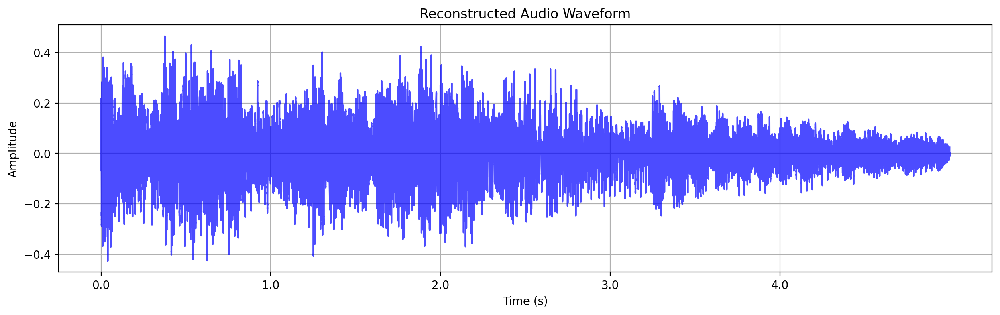

In [22]:
audio_plot(pred_audio, sr, 'blue', 'Reconstructed Audio Waveform')

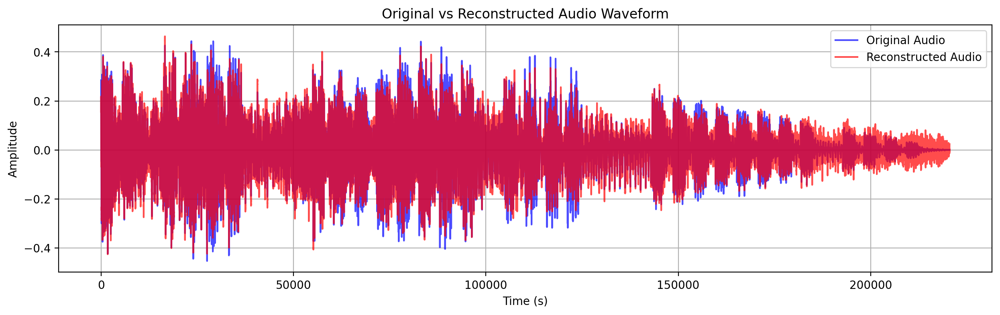

In [23]:
plt.figure(figsize=(15, 4))
plt.plot(audio, color = 'blue', alpha = 0.7, label = 'Original Audio')
plt.plot(pred_audio, color = 'red', alpha = 0.7, label = 'Reconstructed Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Original vs Reconstructed Audio Waveform')
plt.grid()
plt.legend()
plt.show()

In [24]:
# Calculate RMSE and SNR

def calculate_rmse(audio, pred_audio):
    """Calculate the Root Mean Squared Error (RMSE) between original and reconstructed audio signals."""
    # Ensure the inputs are numpy arrays
    original = np.array(audio)
    reconstructed = np.array(pred_audio)
    
    # Compute RMSE
    rmse = np.sqrt(np.mean((original - reconstructed) ** 2))
    return rmse

def calculate_snr(audio, pred_audio):
    """Calculate the Signal-to-Noise Ratio (SNR) between original and reconstructed audio signals."""
    # Ensure the inputs are numpy arrays
    original = np.array(audio)
    reconstructed = np.array(pred_audio)
    
    # Calculate signal power (variance of the original signal)
    signal_power = np.var(original)
    
    # Calculate noise power (variance of the difference between original and reconstructed signals)
    noise_power = np.var(original - reconstructed)
    
    # Calculate SNR in dB
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

# Calculate RMSE
rmse_value = calculate_rmse(audio, pred_audio)
print(f"RMSE: {rmse_value}")

# Calculate SNR
snr_value = calculate_snr(audio, pred_audio)
print(f"SNR: {snr_value} dB")

RMSE: 0.033702000975608826
SNR: 10.104671716690063 dB
